In [1]:
# %pip install timm
# %pip install miniminiai

In [2]:
import pickle,gzip,math,os,time,shutil,torch,random,timm,torchvision,io,PIL
import fastcore.all as fc,matplotlib as mpl,numpy as np,matplotlib.pyplot as plt
from pathlib import Path

import torchvision.transforms.functional as TF,torch.nn.functional as F
from torchvision import transforms
from torch import tensor,nn,optim
from torch.utils.data import DataLoader,default_collate
from torch.nn import init
from torch.optim import lr_scheduler
from fastcore.foundation import L, store_attr

from miniminiai import *

from PIL import Image

In [3]:
def load_image_to_tensor(filepath):
    # Open the image file
    with Image.open(filepath) as img:
        # Convert the image to a tensor
        tensor_transform = transforms.ToTensor()
        image_tensor = tensor_transform(img)
    return image_tensor.to(def_device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 256, 256])


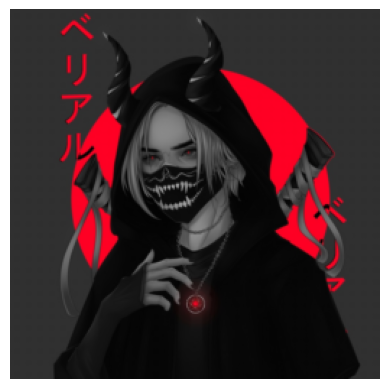

In [4]:
input_path = "og2.jpg"
base_im = load_image_to_tensor(input_path)
base_im = transforms.Resize((256, 256))(base_im)
show_image(base_im);
print(base_im.shape)

In [5]:
spiderweb_url = "https://images.pexels.com/photos/34225/spider-web-with-water-beads-network-dewdrop.jpg?w=256"

In [6]:
def download_image(url):
    imgb = fc.urlread(url, decode=False) 
    return torchvision.io.decode_image(tensor(list(imgb), dtype=torch.uint8)).float()/255.

In [7]:
class LengthDataset():
    def __init__(self, length=1): self.length=length
    def __len__(self): return self.length
    def __getitem__(self, idx): return 0,0

def get_dummy_dls(length=100):
    return DataLoaders(DataLoader(LengthDataset(length), batch_size=1), # Train
                       DataLoader(LengthDataset(1), batch_size=1))      # Valid (length 1)

A simple model that can be trained to generate a specific image from noise. The parameters to be trained in this model are just the pixel values of the image.

In [8]:
class TensorModel(nn.Module):
    def __init__(self, t):
        super().__init__()
        self.t = nn.Parameter(t.clone())
    def forward(self, x=0): return self.t

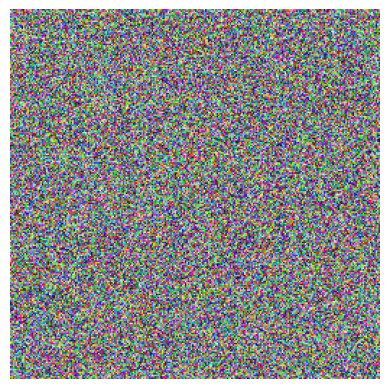

In [9]:
model = TensorModel(torch.rand_like(base_im))
show_image(model());

In [10]:
[p.shape for p in model.parameters()]

[torch.Size([3, 256, 256])]

Call back class for the Learner to work with this type of model

In [11]:
class ImageOptCB(TrainCB):
    def predict(self, learn): learn.preds = learn.model()
    def get_loss(self, learn): learn.loss = learn.loss_func(learn.preds)

In [12]:
def loss_fn_mse(im):
    return F.mse_loss(im, base_im)

model = TensorModel(torch.rand_like(base_im))
cbs = [ImageOptCB(), ProgressCB(), MetricsCB(), DeviceCB()]
learn = Learner(model, get_dummy_dls(100), loss_fn_mse, 
                lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1)

loss,epoch,train
0.056,0,train
0.002,0,eval


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


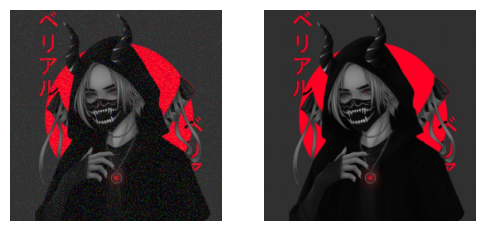

In [13]:
# Result (left) vs target image (right):
show_images([learn.model().clip(0, 1), base_im]);

Callback to visualize the pixel value updates over time 

In [14]:
class ImageLogCB(Callback):
    order = ProgressCB.order + 1
    def __init__(self, log_every=10): store_attr(); self.images=[]; self.i=0
    def after_batch(self, learn): 
        if self.i%self.log_every == 0: self.images.append(to_cpu(learn.preds.clip(0, 1)))
        self.i += 1
    def after_fit(self, learn): show_images(self.images)

loss,epoch,train
0.038,0,train
0.000,0,eval


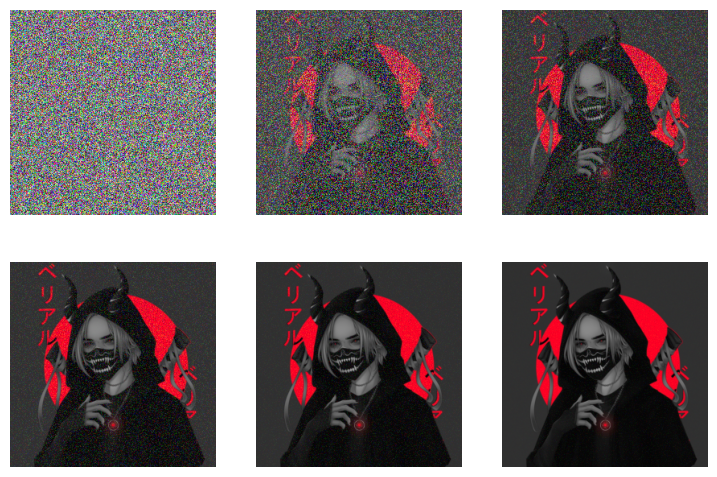

In [15]:
model = TensorModel(torch.rand_like(base_im))
learn = Learner(model, get_dummy_dls(150), loss_fn_mse, 
                lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(30)])

## Style transfer

![vgg diag](https://neurohive.io/wp-content/uploads/2018/11/vgg16-1-e1542731207177.png)

Extracting features from VGG16 for capturing the "artistic" style of the target image

In [16]:
vgg16 = timm.create_model('vgg16', pretrained=True).to(def_device).features

In [17]:
vgg16

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

VGG16 was trained on ImageNet dataset with normalization along each color channel.
So in order to use the model to extract features, we need to normalize the base_im image with the mean and standard deviation of the ImageNet dataset (hardcoded in the following cell)

In [18]:
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

In [19]:
normalize(base_im).min(), normalize(base_im).max()

(tensor(-2.0737, device='cuda:0'), tensor(2.2489, device='cuda:0'))

Function to extract features captured in intermediate layers:

In [20]:
def calc_features(imgs, target_layers=(18, 25)): 
    x = normalize(imgs)
    feats = []
    for i, layer in enumerate(vgg16[:max(target_layers)+1]):
        x = layer(x)
        if i in target_layers:
            feats.append(x.clone())
    return feats

In [21]:
feats = calc_features(base_im)
[f.shape for f in feats]

[torch.Size([512, 32, 32]), torch.Size([512, 16, 16])]

Creating a loss function to capture the structure of the original image (Content/Perceptual loss)

In [22]:
class ContentLossToTarget():
    def __init__(self, target_im, target_layers=(18, 25)):
        fc.store_attr()
        with torch.no_grad():
            self.target_features = calc_features(target_im, target_layers)
    def __call__(self, input_im): 
        return sum((f1-f2).pow(2).mean() for f1, f2 in 
               zip(calc_features(input_im, self.target_layers), self.target_features))

loss,epoch,train
7.583,0,train
2.672,0,eval


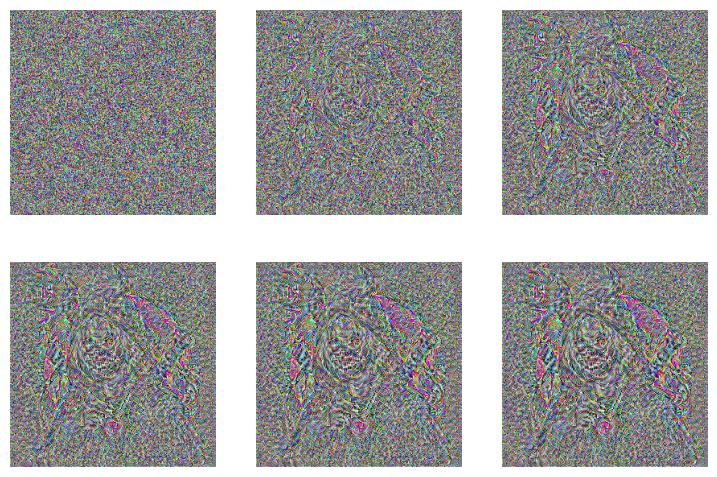

In [23]:
loss_function_perceptual = ContentLossToTarget(base_im)
model = TensorModel(torch.rand_like(base_im))
learn = Learner(model, get_dummy_dls(150), loss_function_perceptual, 
                lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(log_every=30)])

Selecting earlier layers to capture more of the textures of the original image

loss,epoch,train
2.699,0,train
0.482,0,eval


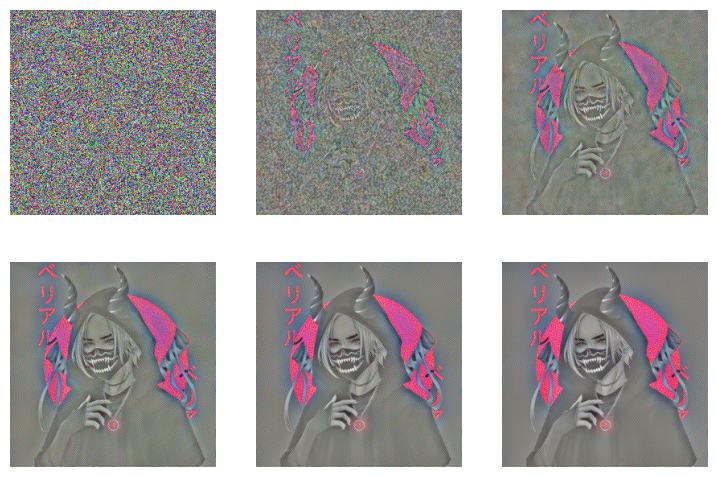

In [24]:
loss_function_perceptual = ContentLossToTarget(base_im, target_layers=(1, 6))
model = TensorModel(torch.rand_like(base_im))
learn = Learner(model, get_dummy_dls(150), loss_function_perceptual, 
                lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(log_every=30)])

Creating the "Style Loss" using the features of the target image

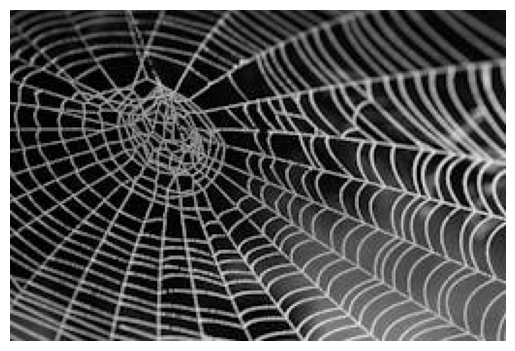

In [25]:
style_im = download_image(spiderweb_url).to(def_device)
show_image(style_im);

Creating Gram matrix of the target to evaluate if an image has the "style" features of the target image

In [26]:
def calc_grams(img, target_layers=(1, 6, 11, 18, 25)):
    return L(torch.einsum('chw, dhw -> cd', x, x) / (x.shape[-2]*x.shape[-1]) # 'bchw, bdhw -> bcd' if batched
            for x in calc_features(img, target_layers))

In [27]:
style_grams = calc_grams(style_im)
[g.shape for g in style_grams]

[torch.Size([64, 64]),
 torch.Size([128, 128]),
 torch.Size([256, 256]),
 torch.Size([512, 512]),
 torch.Size([512, 512])]

In [28]:
class StyleLossToTarget():
    def __init__(self, target_im, target_layers=(1, 6, 11, 18, 25)):
        fc.store_attr()
        with torch.no_grad(): self.target_grams = calc_grams(target_im, target_layers)
    def __call__(self, input_im): 
        return sum((f1-f2).pow(2).mean() for f1, f2 in 
               zip(calc_grams(input_im, self.target_layers), self.target_grams))

In [29]:
style_loss = StyleLossToTarget(style_im)
# style loss is high because the base_im image is completely different from the style image
style_loss(base_im)

tensor(428.0456, device='cuda:0', grad_fn=<AddBackward0>)

## Creating the style transfer model

loss,epoch,train
78.462,0,train
49.980,0,eval


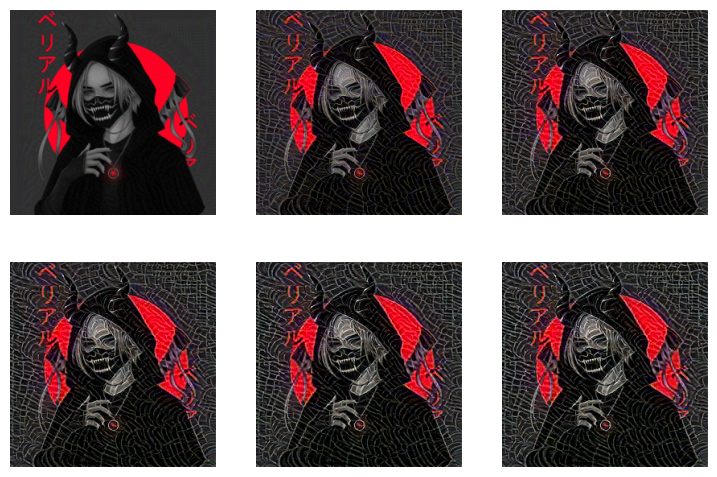

In [30]:
model = TensorModel(base_im) # Start from content image
style_loss = StyleLossToTarget(style_im)
content_loss = ContentLossToTarget(base_im)
def combined_loss(x):
    return style_loss(x) + content_loss(x)
learn = Learner(model, get_dummy_dls(150), combined_loss, lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(30)])

In [31]:
def styletransfer(base_im, target, content_loss_weight=1, style_loss_weight=1, iter=150, log_interval=5):
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    normalize(base_im)
    normalize(target)
    model = TensorModel(base_im)
    style_loss = StyleLossToTarget(target)
    content_loss = ContentLossToTarget(base_im)
    def combined_loss(x):
        return style_loss(x) * style_loss_weight + content_loss(x) * content_loss_weight
    learn = Learner(model, get_dummy_dls(iter), combined_loss, lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
    learn.fit(1, cbs=[ImageLogCB(iter/log_interval)])
    return learn.model()

torch.Size([3, 1440, 2560])


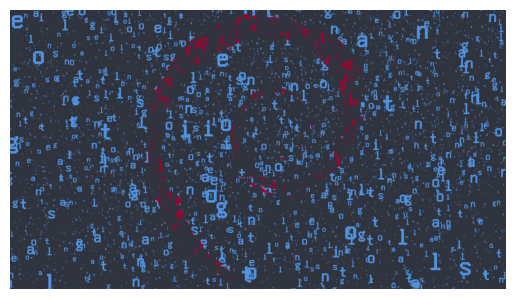

In [32]:
target_path = "p2.jpg"
target = load_image_to_tensor(target_path)
# target = transforms.Resize((256, 256))(target)
show_image(target);
print(target.shape)

loss,epoch,train
4.955,0,train
4.068,0,eval


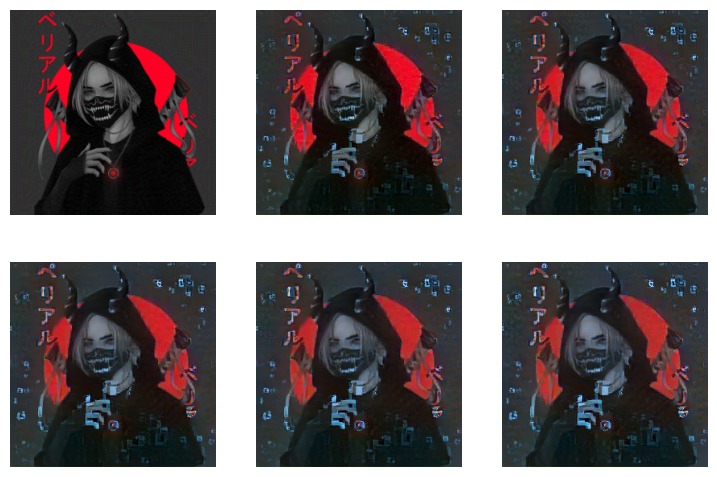

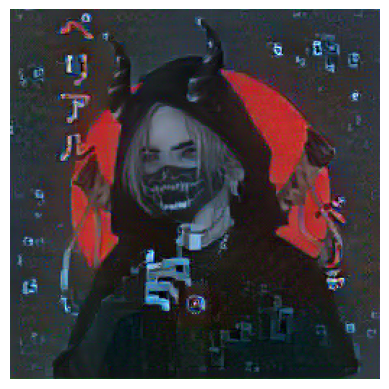

In [33]:
model = styletransfer(base_im, target, content_loss_weight=.25, style_loss_weight=1, iter=1000)
show_image(model.clip(0, 1));

loss,epoch,train
78.409,0,train
49.944,0,eval


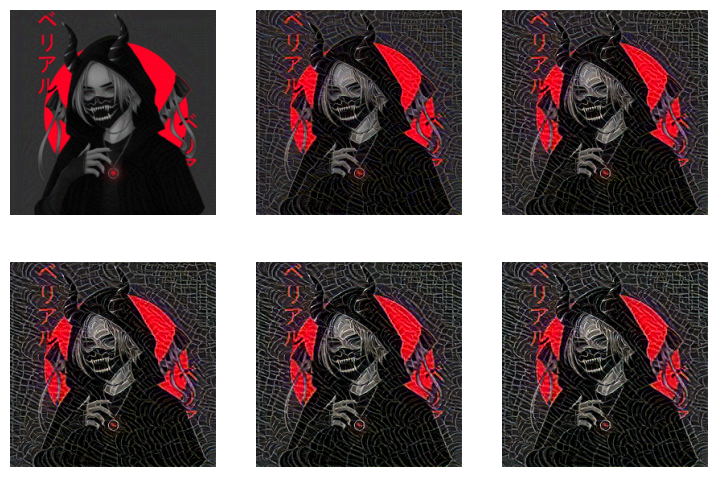

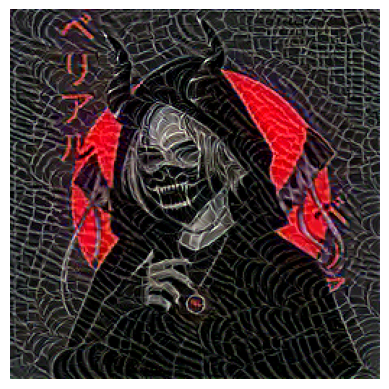

In [34]:
model = styletransfer(base_im, style_im, content_loss_weight=1, style_loss_weight=1, iter=150)
show_image(model.clip(0, 1));

torch.Size([3, 934, 1160])


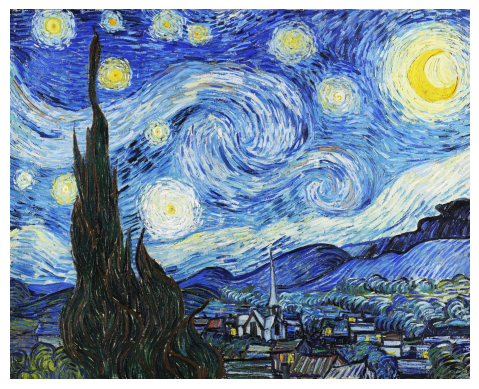

In [35]:
target_path = "p3.jpg"
target = load_image_to_tensor(target_path)
show_image(target);
print(target.shape)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


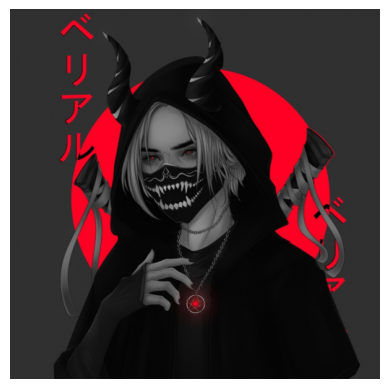

In [36]:
base_im = load_image_to_tensor("og2.jpg")
base_im = transforms.Resize((512, 512))(base_im)
show_image(base_im);

loss,epoch,train
4.162,0,train
3.367,0,eval


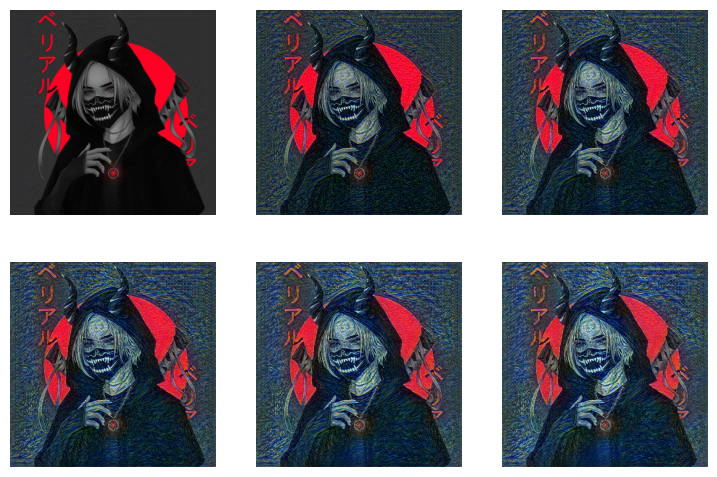

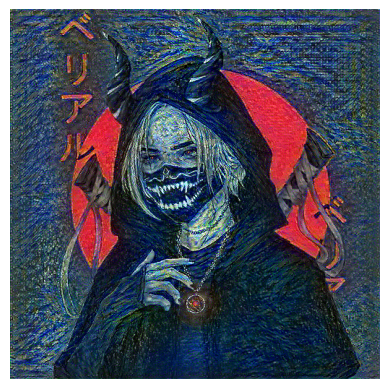

In [37]:
model = styletransfer(base_im, target, content_loss_weight=.5, style_loss_weight=1, iter=1000)
show_image(model.clip(0, 1));

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


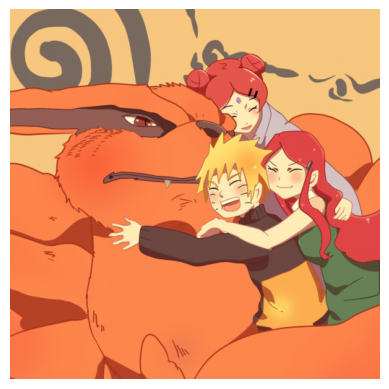

In [38]:
base_im = load_image_to_tensor("og4.jpg")
base_im = transforms.Resize((512, 512))(base_im)
show_image(base_im);

loss,epoch,train
77.736,0,train
50.434,0,eval


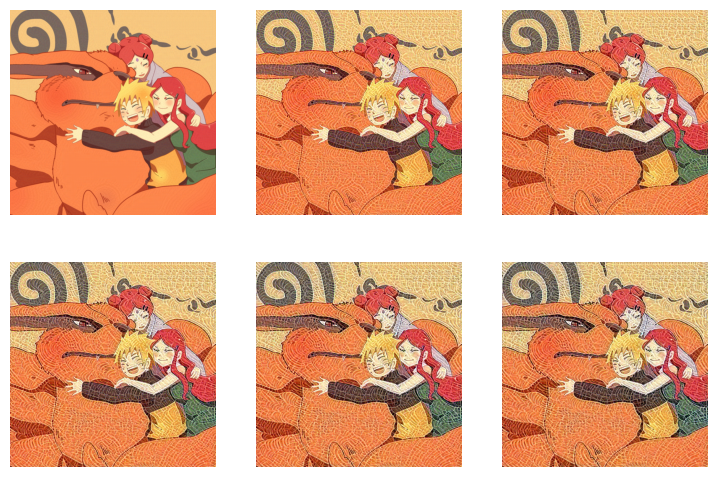

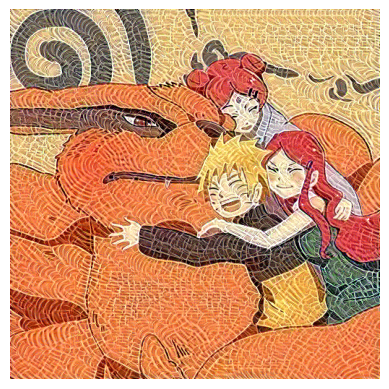

In [39]:
model = styletransfer(base_im, style_im, content_loss_weight=1, style_loss_weight=1, iter=200)
show_image(model.clip(0, 1));